# Initial setting

**Please ONLY change initial setting part of the code.**

To use this deep learning code, you will need to prepare the following three things. For the image and XML zip files, you can do it like in the examples by providing a Google Drive share link ID.

1. a zip file named **images.zip** of all images. The zip file should contain all images directly in the root folder of the zip file and not in any subfolders.
2. a zip file named **xmls.zip** of all XML files. The zip file should contain all xml files directly in the root folder of the zip file and not in any subfolders.
3. set the number of iterations

To try an example, simply change the value in the if statement to 1 and choose 'Run All'. Please note that to run the code, you must change the runtime type to GPU.



In [ ]:
import os
import xml.etree.ElementTree as ET
import os
import xml.etree.ElementTree as ET
from google.colab import drive

# create 'xmls' folder if it doesn't exist
if not os.path.exists('xmls'):
    os.makedirs('xmls')


# Mount Google Drive
drive.mount('/content/drive')

# Path to the annotations file in your Drive
annotations_path = '/content/drive/MyDrive/video_0001_annt.xml'
# parse the original annotations XML file
tree = ET.parse(annotations_path)
root = tree.getroot()

# dictionary to store annotations for each frame
annotations_dict = {}

# loop over each pedestrian track in the annotations
for track in root.findall(".//track[@label='pedestrian']"):
    # loop over each frame in this track
    for frame in track.findall("./*[@frame]"):
        # get the frame number
        frame_num = frame.get('frame')
        #print(frame_num)
        # create a new XML tree for this frame if it doesn't exist
        if frame_num not in annotations_dict:
            frame_root = ET.Element("annotation")

            # add the required elements to the new tree
            filename = ET.SubElement(frame_root, "filename")
            filename.text = f"{frame_num}.xml"

            path = ET.SubElement(frame_root, "path")
            path.text = ""

            folder = ET.SubElement(frame_root, "folder")
            folder.text = "xmls"  # set folder name to 'xmls'

            size = ET.SubElement(frame_root, "size")
            width = ET.SubElement(size, "width")
            width.text = "1920"
            height = ET.SubElement(size, "height")
            height.text = "1080"
            depth = ET.SubElement(size, "depth")
            depth.text = "0"

            # add the new frame tree to the dictionary
            annotations_dict[frame_num] = frame_root
        else:
            # get the existing frame tree from the dictionary
            frame_root = annotations_dict[frame_num]

        obj = ET.SubElement(frame_root, "object")
        name = ET.SubElement(obj, "name")
        name.text = "pedestrian"

        bndbox = ET.SubElement(obj, "bndbox")
        xmin = ET.SubElement(bndbox, "xmin")
        xmin.text = str(int(float(frame.get("xtl"))))
        ymin = ET.SubElement(bndbox, "ymin")
        ymin.text = str(int(float(frame.get("ytl"))))
        xmax = ET.SubElement(bndbox, "xmax")
        xmax.text = str(int(float(frame.get("xbr"))))
        ymax = ET.SubElement(bndbox, "ymax")
        ymax.text = str(int(float(frame.get("ybr"))))

# write each frame's annotations to a separate file inside 'xmls' folder
for frame_num, frame_root in annotations_dict.items():
    frame_tree = ET.ElementTree(frame_root)
    filename = f"{frame_num}.xml"
    filepath = os.path.join('xmls', filename)
    #print(filepath)
    frame_tree.write(filepath)


Mounted at /content/drive


In [ ]:
l=annotations_dict.keys()
print(len(l))

2016


In [ ]:
import cv2
import os
import requests

# Create a directory named "images" if it doesn't exist
if not os.path.exists('images'):
    os.makedirs('images')

video_url = "https://data.nvision2.eecs.yorku.ca/PIE_dataset/PIE_clips/set01/"
filename = 'video_0001.mp4'

# Read the video from specified path
cam = cv2.VideoCapture(video_url+filename)

# frame
currentframe = 0
imgcount = 0

while(True):
    # reading from frame
    ret,frame = cam.read()

    if ret:
        if currentframe % 1 ==0 and (str(currentframe) in l):
            imgcount += 1
            # Set the path to the images folder
            path = 'images/'
            name =  str(currentframe) + '.jpg'
            # writing the extracted images to the images folder
            cv2.imwrite(os.path.join(path, name), frame)

        # increasing counter so that it will show how many frames are created
        currentframe += 1
    else:
        print('something wrong')
        break

print("Total number of images:",imgcount)

# Release all space and windows once done
cam.release()
cv2.destroyAllWindows()



something wrong
Total number of images: 2016


In [ ]:
# # Example 1: download equipment images.zip and xmls.zip
# if(1):
#   !gdown 1j46lX8fdD3AAz3_crPfieH9ZId_qRcge
#   !gdown 1gIjNKKMiTswZS5rLYdeUmtLH9wJDGoSJ

# # Example 2: ppe images.zip and xmls.zip
# if(0):
#   !gdown 1j46lX8fdD3AAz3_crPfieH9ZId_qRcge
#   !gdown 1gIjNKKMiTswZS5rLYdeUmtLH9wJDGoSJ

#num of iterations
num_iter = 12




#unzip images file

#Convert all images to jpg format and save the original images in a new folder named "images_old"

In [ ]:
# Import necessary libraries
import imageio        # To read and write image files
from os import listdir  # To list all files in a directory
import cv2         # To read and write image files
import os         # To rename directories

# Create a new directory called "images_temp" in the current working directory
!mkdir images_temp

# Set the path to the directory containing the original images
img_path = 'images/'

# Set the name of the new folder that will contain the modified images
new_folder = 'images_temp/'

# Create a list of all image files in the original directory, excluding any files with 'json' or 'ipynb_checkpoints' in their names
img_list = [img_path + f for f in listdir(img_path) if 'json' not in f and 'ipynb_checkpoints' not in f]

# For each image in the list, open the image, modify it, and save the modified image to the new folder
for img_name in img_list:
  # Print the name of the current image being processed
  print(img_name)

  # Read the image file using OpenCV
  imageio_image = cv2.imread(img_name)

  # Extract the name of the image file without the file extension
  img_name = img_name.split("/")[-1]

  # Set the path and name for the modified image file
  new_image_path = new_folder +img_name.split('.')[0]+".jpg"

  # Write the modified image to the new path and file name using Imageio
  imageio.imwrite(new_image_path, imageio_image)

# Rename the original "images" folder to "images_old"
os.rename('images', 'images_old')

# Rename the new "images_temp" folder to "images"
os.rename('images_temp', 'images')


images/1337.jpg
images/15153.jpg
images/16540.jpg
images/17120.jpg
images/13714.jpg
images/1167.jpg
images/17277.jpg
images/17254.jpg
images/15277.jpg
images/13922.jpg
images/16527.jpg
images/16419.jpg
images/10003.jpg
images/13854.jpg
images/10054.jpg
images/1474.jpg
images/1564.jpg
images/15269.jpg
images/10056.jpg
images/13765.jpg
images/13690.jpg
images/15189.jpg
images/17242.jpg
images/14062.jpg
images/15249.jpg
images/16481.jpg
images/13988.jpg
images/16307.jpg
images/15176.jpg
images/1415.jpg
images/15273.jpg
images/17287.jpg
images/16223.jpg
images/13880.jpg
images/13706.jpg
images/1355.jpg
images/10075.jpg
images/13648.jpg
images/13712.jpg
images/16519.jpg
images/16275.jpg
images/13750.jpg
images/15272.jpg
images/13550.jpg
images/1437.jpg
images/13759.jpg
images/13878.jpg
images/15255.jpg
images/14051.jpg
images/13939.jpg
images/13746.jpg
images/1142.jpg
images/13832.jpg
images/13948.jpg
images/13960.jpg
images/13833.jpg
images/1588.jpg
images/1367.jpg
images/13511.jpg
images/

#Check whether the number of images matches the number of XML files. If not, delete any images that do not have an accompanying XML file.


In [ ]:
# Get a list of XML file names without the extension
xml_list = [f.split('.')[0] for f in listdir("xmls")]

# Get a list of all image file names
image_list = [f for f in listdir("images")]

# Iterate over the list of image file names
for img in image_list:
  # Check if the image file name (without extension or path) is in the list of XML file names
  if img.split('/')[-1].split('.')[0] not in xml_list:
    # If the image file does not have an accompanying XML file, and if it is a JPEG image, delete it
    if 'jpg' in img:
      print(img, "deleted") # Print the name of the file being deleted
      img_path = "images/" + img
      !rm {img_path} # Delete the file using shell command

#install xmltodict

In [ ]:
!pip install xmltodict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Determine the number of categories present in the XML files

In [ ]:
# Import necessary libraries
from os import listdir
import xmltodict

# Initialize an empty list to store the labels
label_list = []

# Get a list of all XML files in the "xmls" folder
xml_list = [f for f in listdir("xmls")]
xml_list=xml_list[:-1]
print(xml_list)

# Iterate over the list of XML files
c=0
for x in xml_list:
  # Get the path of the current XML file
  annotation_path = "xmls/"+x
  print(annotation_path,c)
  # Parse the XML file using xmltodict library
  doc = xmltodict.parse(open(annotation_path).read(), force_list=('object'))

  # Check if the 'object' tag is present in the XML file
  if 'object' in doc['annotation']:
    # If present, iterate over each 'object' tag in the XML file
    for i, obj in enumerate(doc['annotation']['object']):

      # If the label is 'Gas Monitor', update it to 'Gas Detection Devices'
      if obj['name']=='Gas Monitor':
        print('changed')
        label_list.append('Gas Detection Devices')
        doc['annotation']['object'][i]['name'] = 'Gas Detection Devices'
        # Write the updated XML file
        with open(annotation_path, 'w') as result_file:
            result_file.write(xmltodict.unparse(doc))
      else:
        # If the label is not 'Gas Monitor', append it to the label list
        label_list.append(obj['name'])

# Get a list of unique labels and sort them in alphabetical order
label_list  = list(set(label_list))
label_list.sort()

# Print the list of labels
cate_names = label_list
print(label_list)


['13576.xml', '16412.xml', '16285.xml', '9991.xml', '13612.xml', '13608.xml', '1410.xml', '16400.xml', '16211.xml', '16308.xml', '1459.xml', '9920.xml', '1046.xml', '13662.xml', '13561.xml', '1196.xml', '15289.xml', '13694.xml', '1197.xml', '1468.xml', '13756.xml', '16353.xml', '13938.xml', '16305.xml', '1354.xml', '16249.xml', '14059.xml', '1120.xml', '1370.xml', '1186.xml', '9961.xml', '16391.xml', '10054.xml', '13620.xml', '13910.xml', '16393.xml', '13951.xml', '16440.xml', '16554.xml', '13917.xml', '13869.xml', '13786.xml', '13518.xml', '13836.xml', '13953.xml', '1089.xml', '15292.xml', '9973.xml', '13693.xml', '16382.xml', '17289.xml', '1345.xml', '13540.xml', '16463.xml', '16408.xml', '1478.xml', '13647.xml', '17127.xml', '10095.xml', '16480.xml', '13658.xml', '15220.xml', '13723.xml', '9942.xml', '15163.xml', '13840.xml', '1324.xml', '15243.xml', '17288.xml', '1017.xml', '13889.xml', '1511.xml', '14026.xml', '13897.xml', '16486.xml', '13764.xml', '16322.xml', '16429.xml', '13740

# Copy the images to the 'train' and 'test' folders

In [ ]:
# Import necessary libraries
from os import listdir
import shutil
import cv2

# Remove the 'train_images' and 'test_images' folders if they exist
!rm -rf "train_images"
!rm -rf "test_images"

# Create the 'train_images' and 'test_images' folders
!mkdir train_images
!mkdir test_images

# Copy the images to the 'train' and 'test' folders
image_path = "images/"
images = [f for f in listdir(image_path)]
i = 0
for img in images:
  # Skip any image files that have 'json' in the file name
  if 'json' in img:
    continue

  # Read the image file using OpenCV
  im = cv2.imread(image_path+img)
  print(img)

  # Determine the destination folder based on the modulo of i. 1/3 testing and 2/3 training
  src = image_path+img
  if i%3==0:
    dst = "test_images/"+img
    shutil.copy(src, dst)
  else:
    dst = "train_images/"+img
    shutil.copy(src, dst)

  # Increment the counter i
  i = i + 1


1337.jpg
15153.jpg
16540.jpg
17120.jpg
13714.jpg
1167.jpg
17277.jpg
17254.jpg
15277.jpg
13922.jpg
16527.jpg
16419.jpg
10003.jpg
13854.jpg
10054.jpg
1474.jpg
1564.jpg
15269.jpg
10056.jpg
13765.jpg
13690.jpg
15189.jpg
17242.jpg
14062.jpg
15249.jpg
16481.jpg
13988.jpg
16307.jpg
15176.jpg
1415.jpg
15273.jpg
17287.jpg
16223.jpg
13880.jpg
13706.jpg
1355.jpg
10075.jpg
13648.jpg
13712.jpg
16519.jpg
16275.jpg
13750.jpg
15272.jpg
13550.jpg
1437.jpg
13759.jpg
13878.jpg
15255.jpg
14051.jpg
13939.jpg
13746.jpg
1142.jpg
13832.jpg
13948.jpg
13960.jpg
13833.jpg
1588.jpg
1367.jpg
13511.jpg
13564.jpg
13977.jpg
13605.jpg
13633.jpg
13616.jpg
13782.jpg
15297.jpg
10568.jpg
1372.jpg
1168.jpg
16211.jpg
1511.jpg
13580.jpg
16556.jpg
1605.jpg
16526.jpg
13907.jpg
1064.jpg
1024.jpg
14034.jpg
13989.jpg
1191.jpg
13800.jpg
13957.jpg
10071.jpg
17142.jpg
16544.jpg
10089.jpg
16375.jpg
1094.jpg
1429.jpg
14031.jpg
1183.jpg
16542.jpg
14009.jpg
16410.jpg
10066.jpg
1360.jpg
14003.jpg
13851.jpg
13715.jpg
16274.jpg
17296.jpg
1

# image augmentation

## define different augmentation methods

In [ ]:
# Import necessary libraries
import os
import glob
import xml.etree.ElementTree as ET
import xmltodict
import json
from xml.dom import minidom
from collections import OrderedDict
from PIL import Image
from os import listdir
import imgaug as ia
import imageio
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

# Define a list of image augmentation techniques to be used
original = iaa.Affine(rotate=(0, 0))
rotate10=iaa.Affine(rotate=(10, 10))
rotate20=iaa.Affine(rotate=(20, 20))
rotate30=iaa.Affine(rotate=(30, 30))
rotate40=iaa.Affine(rotate=(40, 40))
rotate50=iaa.Affine(rotate=(50, 50))
rotate60=iaa.Affine(rotate=(60, 60))
rotate70=iaa.Affine(rotate=(70, 70))
rotate80=iaa.Affine(rotate=(80, 80))
rotate90=iaa.Affine(rotate=(90, 90))
rotate120=iaa.Affine(rotate=(120, 120))
rotate150=iaa.Affine(rotate=(150, 150))
rotate180=iaa.Affine(rotate=(180, 180))
gaussian_noise=iaa.AdditiveGaussianNoise(10,20)
crop = iaa.Crop(percent=(0, 0.3)) # crop image
shear = iaa.Affine(shear=(0,50))
flip_hr=iaa.Fliplr(p=1.0)
flip_vr=iaa.Flipud(p=1.0)
contrast=iaa.GammaContrast(gamma=2.0)
scale_im=iaa.Affine(scale={"x": (1.5, 1.0), "y": (1.5, 1.0)})

# Create a dictionary mapping each technique name to its corresponding imgaug object
augs = {'original':original,'gaussian':gaussian_noise,'contrast':contrast,'rotate10':rotate10,'rotate20':rotate20,'rotate30':rotate30,'rotate40':rotate40,'rotate50':rotate50,'rotate60':rotate60,'rotate70':rotate70,'rotate80':rotate80,'rotate90':rotate90,'rotate120':rotate120,'rotate150':rotate150,'rotate180':rotate180, 'flip_hr':flip_hr, 'flip_vr':flip_vr}


## part 1 generate augmented images

In [ ]:
# Create 'train_images_aug' and 'test_images_aug' directories if they don't exist
!mkdir train_images_aug
!mkdir test_images_aug

# Import necessary libraries
import os
import glob
import cv2

# Define a function to create augmented images from the original images in a folder
def create_aug_image(old_folder, new_folder, augs):
  img_list = []
  # Get a list of image files in the old folder
  img_list = [old_folder+f for f in listdir(old_folder) if 'json' not in f and 'ipynb_checkpoints' not in f]

  k = 0
  # Iterate over each image file in the old folder
  for img_name in img_list:
    print(img_name)
    # Read the image file using OpenCV
    imageio_image = cv2.imread(img_name)
    print(k)
    k=k+1
    # Iterate over each augmentation technique in the 'augs' dictionary
    for v,a in augs.items():
      # Get the name of the image file
      img_name = img_name.split("/")[-1]
      # Apply the current augmentation technique to the image
      image_aug = a(image=imageio_image)
      # Construct the path and filename for the new image file
      new_image_path = new_folder+img_name.split('.')[0]+"_"+v+".jpg"
      # Save the new image file
      imageio.imwrite(new_image_path, image_aug)

# Define the paths for the original and augmented image folders for training and testing
old_folder = "train_images/"
new_folder = "train_images_aug/"
# Call the create_aug_image function to create augmented images for the training set
create_aug_image(old_folder, new_folder,augs)

old_folder = "test_images/"
new_folder = "test_images_aug/"
# Call the create_aug_image function to create augmented images for the testing set
create_aug_image(old_folder, new_folder,augs)


train_images/15153.jpg
0
train_images/16540.jpg
1
train_images/13714.jpg
2
train_images/1167.jpg
3
train_images/17254.jpg
4
train_images/15277.jpg
5
train_images/16527.jpg
6
train_images/16419.jpg
7
train_images/13854.jpg
8
train_images/10054.jpg
9
train_images/1564.jpg
10
train_images/15269.jpg
11
train_images/13765.jpg
12
train_images/13690.jpg
13
train_images/17242.jpg
14
train_images/14062.jpg
15
train_images/16481.jpg
16
train_images/13988.jpg
17
train_images/15176.jpg
18
train_images/1415.jpg
19
train_images/17287.jpg
20
train_images/16223.jpg
21
train_images/13706.jpg
22
train_images/1355.jpg
23
train_images/13648.jpg
24
train_images/13712.jpg
25
train_images/16275.jpg
26
train_images/13750.jpg
27
train_images/13550.jpg
28
train_images/1437.jpg
29
train_images/13878.jpg
30
train_images/15255.jpg
31
train_images/13939.jpg
32
train_images/13746.jpg
33
train_images/13832.jpg
34
train_images/13948.jpg
35
train_images/13833.jpg
36
train_images/1588.jpg
37
train_images/13511.jpg
38
tr

## part 2 generate coco json file

In [ ]:
def aug_json(old_folder, new_folder, augs):

  image_list = [f for f in listdir(old_folder) if ".jpg" in f]

  attrDict = dict()
  attrDict["categories"]=[{"supercategory":"none","id":i,"name":n} for i,n in enumerate(cate_names)]


  name_list = [a['name'] for a in attrDict['categories']]

  images = list()
  annotations = list()
  image_id = 0

  for img_name in image_list:
    print(img_name)

    # for img_name in train_image_list:
    anno_name = img_name.split(".")[0] + ".xml"
    annotation_path="xmls/" + anno_name

    doc = xmltodict.parse(open(annotation_path).read(), force_list=('object'))

    id1 = 0
    bbs_set = []

    imageio_image = imageio.imread(old_folder+img_name)
    # imageio_image = cv2.imread("images/images 1-167/"+img_name)

    if 'object' in doc['annotation']:
      for obj in doc['annotation']['object']:
          if str(obj['name']) in name_list:
            # x1 = int(obj["bndbox"]["xmin"])
            # y1 = int(obj["bndbox"]["ymin"])
            x1 = int(obj["bndbox"]["xmin"])  - 1
            y1 = int(obj["bndbox"]["ymin"]) - 1
            x2 = int(obj["bndbox"]["xmax"])
            y2 = int(obj["bndbox"]["ymax"])

            bbs_set.append(BoundingBox(x1=x1, x2=x2, y1=y1, y2=y2, label=str(obj['name'])))

    #add bounding boxes
    bbs = BoundingBoxesOnImage(bbs_set, shape=imageio_image.shape)
    # print(bbs)

    #augmentation
    for v,a in augs.items():
      image = dict()
      image_id = image_id + 1
      print(image_id)
      image_aug, bbs_aug = a(image=imageio_image, bounding_boxes=bbs)
      bbs_aug = bbs_aug.remove_out_of_image().clip_out_of_image()
      new_image_path = new_folder+img_name.split('.')[0]+"_"+v+".jpg"
      new_image_name = img_name.split('.')[0]+"_"+v+".jpg"
      print(new_image_path)
      # imageio.imwrite(new_image_path, image_aug)

      image['file_name'] = new_image_name
      image['width'] = image_aug.shape[1]
      image['height'] = image_aug.shape[0]
      image['id'] = image_id

      images.append(image)

      # for each value in the bbs_aug
      for bag in bbs_aug.bounding_boxes:
        # print(bag)
        annotation = dict()
        annotation["iscrowd"] = 0
        annotation["image_id"] = image_id
        x1 = int(bag.x1)
        x2 = int(bag.x2)
        y1 = int(bag.y1)
        y2 = int(bag.y2)

        annotation["bbox"] = [x1, y1, x2-x1, y2-y1]
        annotation["area"] = float((x2-x1) * (y2-y1))
        annotation["category_id"] = name_list.index(bag.label)
        annotation["ignore"] = 0
        annotation["id"] = id1
        annotation["segmentation"] = [[x1,y1,x1,y2, x2, y2, x2, y1]]
        annotation['file_name'] = new_image_name
        annotation['height'] = int(doc['annotation']['size']['height'])
        annotation['width'] = int(doc['annotation']['size']['width'])
        id1 +=1
        annotations.append(annotation)


  attrDict["images"] = images
  attrDict["annotations"] = annotations
  attrDict["type"] = "instances"


  jsonString = json.dumps(attrDict)
  with open(new_folder+"annotation.json", "w") as f:
      f.write(jsonString)


old_folder = "train_images/"
new_folder = "train_images_aug/"
aug_json(old_folder, new_folder, augs)


old_folder = "test_images/"
new_folder = "test_images_aug/"
aug_json(old_folder, new_folder, augs)


15153.jpg
1
train_images_aug/15153_original.jpg
2
train_images_aug/15153_gaussian.jpg
3
train_images_aug/15153_contrast.jpg
4
train_images_aug/15153_rotate10.jpg
5
train_images_aug/15153_rotate20.jpg
6
train_images_aug/15153_rotate30.jpg
7
train_images_aug/15153_rotate40.jpg
8
train_images_aug/15153_rotate50.jpg
9
train_images_aug/15153_rotate60.jpg
10


<ipython-input-12-7c0c9af8880b>:27: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio_image = imageio.imread(old_folder+img_name)


Streaming output truncated to the last 5000 lines.
8996
test_images_aug/13843_contrast.jpg
8997
test_images_aug/13843_rotate10.jpg
8998
test_images_aug/13843_rotate20.jpg
8999
test_images_aug/13843_rotate30.jpg
9000
test_images_aug/13843_rotate40.jpg
9001
test_images_aug/13843_rotate50.jpg
9002
test_images_aug/13843_rotate60.jpg
9003
test_images_aug/13843_rotate70.jpg
9004
test_images_aug/13843_rotate80.jpg
9005
test_images_aug/13843_rotate90.jpg
9006
test_images_aug/13843_rotate120.jpg
9007
test_images_aug/13843_rotate150.jpg
9008
test_images_aug/13843_rotate180.jpg
9009
test_images_aug/13843_flip_hr.jpg
9010
test_images_aug/13843_flip_vr.jpg
14064.jpg
9011
test_images_aug/14064_original.jpg
9012
test_images_aug/14064_gaussian.jpg
9013
test_images_aug/14064_contrast.jpg
9014
test_images_aug/14064_rotate10.jpg
9015
test_images_aug/14064_rotate20.jpg
9016
test_images_aug/14064_rotate30.jpg
9017
test_images_aug/14064_rotate40.jpg
9018
test_images_aug/14064_rotate50.jpg
9019
test_images_a

# create json file for all converted images (not the augmented images, which already had a json file through the previous code)

In [ ]:
if(1):
  import xmltodict
  import json


  def xml_to_json(img_path, xml_path):

    image_list = [f for f in listdir(img_path)]
    annotation_list = [f for f in listdir(xml_path)]
    print(len(image_list))
    print(len(annotation_list))

    attrDict = dict()
    # attrDict["categories"]=[{"supercategory":"none","id":0,"name":"HEAT EXCHANGER"},
    #               {"supercategory":"none","id":1,"name":"PRESSURE GAUGE"},
    #               {"supercategory":"none","id":2,"name":"PRESSURE VESSEL"},
    #               {"supercategory":"none","id":3,"name":"PUMP"}
    #             ]

    attrDict["categories"]=[{"supercategory":"none","id":i,"name":n} for i,n in enumerate(cate_names)]

    images = list()
    annotations = list()
    image_id = 0
    # for file in xmlFiles:
    for file in image_list:
        # print(file)
        if 'json' in file or 'ipynb_checkpoints' in file:
          continue

        image_id = image_id + 1

        annotation_path=xml_path+file.split('.')[0]+".xml"
        print(annotation_path)
        # sys.exit()
        image = dict()
        doc = xmltodict.parse(open(annotation_path).read(), force_list=('object'))
        image['file_name'] = str(doc['annotation']['filename'])
        image['file_name'] = '.'.join(str(doc['annotation']['filename']).split('.')[:-1]+['jpg'])
        image['height'] = int(doc['annotation']['size']['height'])
        image['width'] = int(doc['annotation']['size']['width'])
        image['id'] = image_id
        print ("File Name: {} and image_id {}".format(file, image_id))

        id1 = 0
        if 'object' in doc['annotation']:
            for obj in doc['annotation']['object']:
                for value in attrDict["categories"]:
                    annotation = dict()
                    if str(obj['name']) == value["name"]:
                        annotation["iscrowd"] = 0
                        annotation["image_id"] = image_id
                        x1 = int(obj["bndbox"]["xmin"])  - 1
                        y1 = int(obj["bndbox"]["ymin"]) - 1
                        x2 = int(obj["bndbox"]["xmax"]) - x1
                        y2 = int(obj["bndbox"]["ymax"]) - y1
                        annotation["bbox"] = [x1, y1, x2, y2]
                        annotation["area"] = float(x2 * y2)
                        annotation["category_id"] = value["id"]
                        annotation["ignore"] = 0
                        annotation["id"] = id1
                        annotation["segmentation"] = [[x1,y1,x1,(y1 + y2), (x1 + x2), (y1 + y2), (x1 + x2), y1]]
                        # annotation['file_name'] = str(doc['annotation']['filename'])
                        annotation['file_name'] = '.'.join(str(doc['annotation']['filename']).split('.')[:-1]+['jpg'])
                        annotation['height'] = int(doc['annotation']['size']['height'])
                        annotation['width'] = int(doc['annotation']['size']['width'])
                        id1 +=1
                        annotations.append(annotation)

        images.append(image)

    attrDict["images"] = images
    attrDict["annotations"] = annotations
    attrDict["type"] = "instances"

    jsonString = json.dumps(attrDict)
    with open(img_path + "annotation.json", "w") as f:
        f.write(jsonString)


  # img_path = "images_old/images 1-167/"
  # xml_path = "xmls/"
  img_path = "images/"
  xml_path = "xmls/"
  xml_to_json(img_path, xml_path)


2016
2016
xmls/1337.xml
File Name: 1337.jpg and image_id 1
xmls/15153.xml
File Name: 15153.jpg and image_id 2
xmls/16540.xml
File Name: 16540.jpg and image_id 3
xmls/17120.xml
File Name: 17120.jpg and image_id 4
xmls/13714.xml
File Name: 13714.jpg and image_id 5
xmls/1167.xml
File Name: 1167.jpg and image_id 6
xmls/17277.xml
File Name: 17277.jpg and image_id 7
xmls/17254.xml
File Name: 17254.jpg and image_id 8
xmls/15277.xml
File Name: 15277.jpg and image_id 9
xmls/13922.xml
File Name: 13922.jpg and image_id 10
xmls/16527.xml
File Name: 16527.jpg and image_id 11
xmls/16419.xml
File Name: 16419.jpg and image_id 12
xmls/10003.xml
File Name: 10003.jpg and image_id 13
xmls/13854.xml
File Name: 13854.jpg and image_id 14
xmls/10054.xml
File Name: 10054.jpg and image_id 15
xmls/1474.xml
File Name: 1474.jpg and image_id 16
xmls/1564.xml
File Name: 1564.jpg and image_id 17
xmls/15269.xml
File Name: 15269.jpg and image_id 18
xmls/10056.xml
File Name: 10056.jpg and image_id 19
xmls/13765.xml
File

#plot image size

#training images

In [ ]:
width = []
height = []
for f in listdir("train_images_aug"):
  if ".jpg" in f:
    img = cv2.imread("train_images_aug/"+f)
    width.append(img.shape[0])
    height.append(img.shape[1])

<ipython-input-15-c67ca65df04c>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
<ipython-input-15-c67ca65df04c>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels)
<ipython-input-15-c67ca65df04c>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


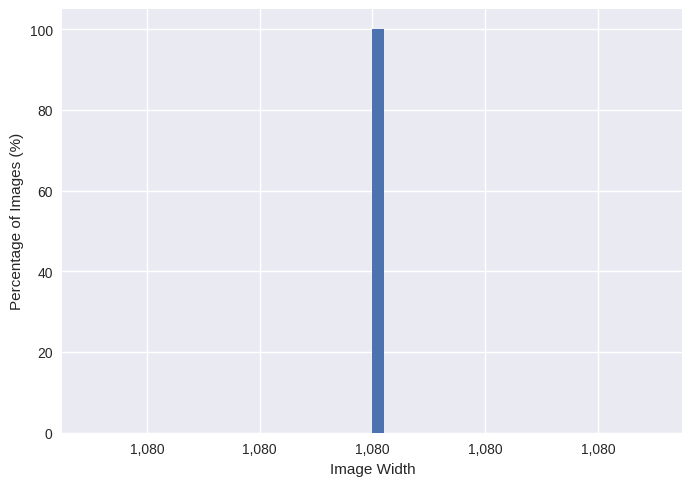

<ipython-input-15-c67ca65df04c>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels)
<ipython-input-15-c67ca65df04c>:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


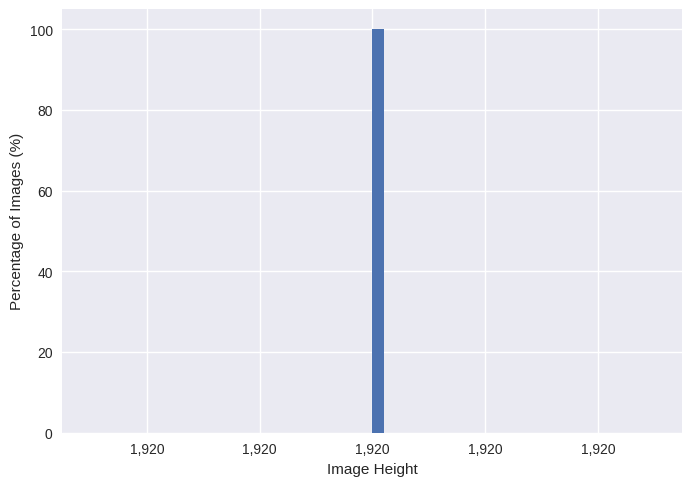

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('seaborn')
import pandas as pd

#width
df = pd.DataFrame(width,columns=['width'])
fig = plt.figure()
ax = plt.axes()
ax.hist(df['width'], bins=50, weights=np.ones_like(df['width'])/len(df['width']), histtype='stepfilled')
xlabels = ['{:,.0f}'.format(x) for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ylabels = ['{:,.0f}'.format(y) for y in ax.get_yticks()*100]
ax.set_yticklabels(ylabels)
ax.set_xlabel('Image Width')
ax.set_ylabel('Percentage of Images (%)')
plt.show()

#height
df = pd.DataFrame(height,columns=['height'])
fig = plt.figure()
ax = plt.axes()
ax.hist(df['height'], bins=50, weights=np.ones_like(df['height'])/len(df['height']), histtype='stepfilled')
xlabels = ['{:,.0f}'.format(x) for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ylabels = ['{:,.0f}'.format(y) for y in ax.get_yticks()*100]
ax.set_yticklabels(ylabels)
ax.set_xlabel('Image Height')
ax.set_ylabel('Percentage of Images (%)')
plt.show()


#testing images

<ipython-input-16-3f84ff3507ee>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
<ipython-input-16-3f84ff3507ee>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels)
<ipython-input-16-3f84ff3507ee>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


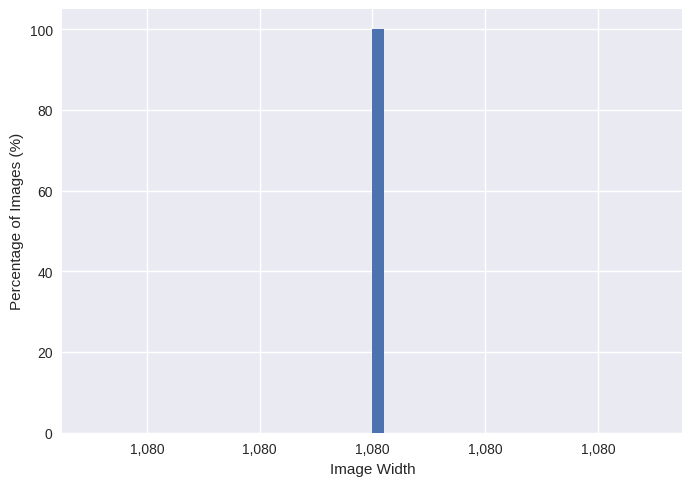

<ipython-input-16-3f84ff3507ee>:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels)
<ipython-input-16-3f84ff3507ee>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


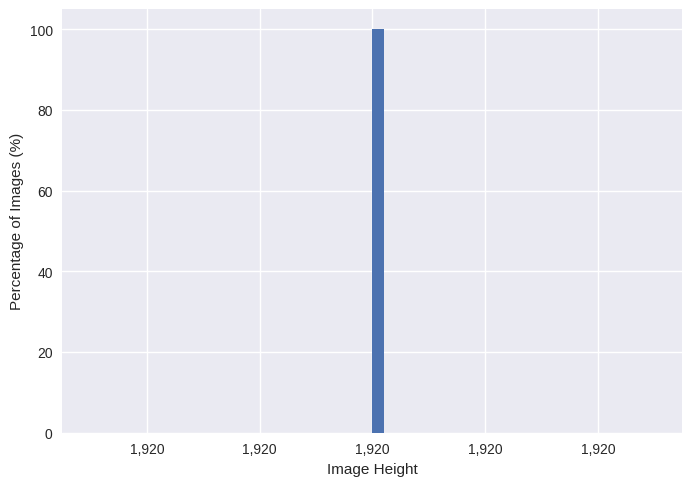

In [ ]:
width = []
height = []
for f in listdir("test_images_aug"):
  if ".jpg" in f:
    img = cv2.imread("test_images_aug/"+f)
    width.append(img.shape[0])
    height.append(img.shape[1])

import matplotlib.pyplot as plt
import numpy as np
plt.style.use('seaborn')
import pandas as pd

#width
df = pd.DataFrame(width,columns=['width'])
fig = plt.figure()
ax = plt.axes()
ax.hist(df['width'], bins=50, weights=np.ones_like(df['width'])/len(df['width']), histtype='stepfilled')
xlabels = ['{:,.0f}'.format(x) for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ylabels = ['{:,.0f}'.format(y) for y in ax.get_yticks()*100]
ax.set_yticklabels(ylabels)
ax.set_xlabel('Image Width')
ax.set_ylabel('Percentage of Images (%)')
plt.show()

#height
df = pd.DataFrame(height,columns=['height'])
fig = plt.figure()
ax = plt.axes()
ax.hist(df['height'], bins=50, weights=np.ones_like(df['height'])/len(df['height']), histtype='stepfilled')
xlabels = ['{:,.0f}'.format(x) for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ylabels = ['{:,.0f}'.format(y) for y in ax.get_yticks()*100]
ax.set_yticklabels(ylabels)
ax.set_xlabel('Image Height')
ax.set_ylabel('Percentage of Images (%)')
plt.show()

# fiftyone

## install fiftyone

In [ ]:
!pip install --upgrade pip setuptools wheel
!pip install fiftyone
!pip install "opencv-python-headless<4.3"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 69.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.0/40.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.8/226.8 kB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 44.1 MB/s eta 0:00:00

## run fiftyone

In [ ]:
 import fiftyone as fo
import fiftyone.zoo as foz

# The directory containing the dataset to import
data_path = "train_images_aug/"
labels_path = "train_images_aug/annotation.json"

# The type of the dataset being imported
dataset_type = fo.types.COCODetectionDataset  # for example

# Import the dataset
dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=data_path,
    labels_path=labels_path,
)

session = fo.launch_app(dataset)



Migrating database to v0.20.1


INFO:fiftyone.migrations.runner:Migrating database to v0.20.1


 100% |█████████████| 22848/22848 [4.5m elapsed, 0s remaining, 83.8 samples/s]       


INFO:eta.core.utils: 100% |█████████████| 22848/22848 [4.5m elapsed, 0s remaining, 83.8 samples/s]       


# create json for train and test images

In [ ]:
# img_path = "train_images/"
# xml_path = "xmls/"
# xml_to_json(img_path, xml_path)

# img_path = "test_images/"
# xml_path = "xmls/"
# xml_to_json(img_path, xml_path)



#detectron2 training

## install dependencies

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 19.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=d81df7aa8a3b4b39d08a534ca7d4a29e74a90e6ad065102fae0c8b67ec40e762
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.2.1 requires opencv-python-headless>=4.1.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
dask 2022.12.1 requires pyyaml>=5.3

torch:  2.0 ; cuda:  cu118
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu118/torch2.0/index.html
ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-8acwaowu
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-8acwaowu
  Resolved https://github.com/facebookresearch/detectron2.git to commit d4a5f28e01b2babbaba9f90198fb95f5c661cccd
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

## import libraries

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
try:
  import detectron2
except:
  import detectron2

from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

##change train_images_aug to train_images and test_images_aug to test_images

In [ ]:
import os
os.rename('train_images', 'train_images_old')     #rename it
os.rename('test_images', 'test_images_old')     #rename it
os.rename('train_images_aug', 'train_images')     #rename it
os.rename('test_images_aug', 'test_images')     #rename it

##prepare and registering for database

In [ ]:
import json, os
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

# from detectron2.data.datasets import register_coco_instances

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "annotation.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)
    dataset_dicts = []
    image_recorded = []

    image_id = 0
    for idx, v in enumerate(imgs_anns['annotations']):
        # print(v)

        if v['file_name'] not in image_recorded:
          record = {}
          objs = []
          record["file_name"] = os.path.join(img_dir, v["file_name"])
          record["image_id"] = v['image_id']
          record["height"] = v['height']
          record["width"] = v['width']

          obj = {
            "bbox": v['bbox'],
            "bbox_mode": BoxMode.XYWH_ABS,
            # "bbox_mode": BoxMode.XYXY_ABS,
            # "segmentation": v['segmentation'],
            "category_id": v['category_id'],
            "iscrowd":v['iscrowd'],
          }
          record["annotations"] = [obj]
          dataset_dicts.append(record)
          image_recorded.append(v['file_name'])

        else:
          #find which image
          iidx = image_recorded.index(v['file_name'])
          obj = {
            "bbox": v['bbox'],
            "bbox_mode": BoxMode.XYWH_ABS,
            # "bbox_mode": BoxMode.XYXY_ABS,
            # "segmentation": v['segmentation'],
            "category_id": v['category_id'],
            "iscrowd":v['iscrowd'],
          }
          dataset_dicts[iidx]['annotations'].append(obj)

    return dataset_dicts

cate_names=['pedestrian']
#combined countries
for d in ["train", "test"]:
    DatasetCatalog.register("RDD_" + d, lambda d=d: get_balloon_dicts(d+"_images"))
    # MetadataCatalog.get("RDD_" + d).set(thing_classes = ['HEAT EXCHANGER', 'PRESSURE GAUGE', 'PRESSURE VESSEL', 'PUMP'])
    MetadataCatalog.get("RDD_" + d).set(thing_classes = cate_names)





## plot some training images

[{'file_name': 'train_images/15153_original.jpg', 'image_id': 1, 'height': 1080, 'width': 1920, 'annotations': [{'bbox': [786, 809, 10, 32], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 0, 'iscrowd': 0}]}, {'file_name': 'train_images/15153_gaussian.jpg', 'image_id': 2, 'height': 1080, 'width': 1920, 'annotations': [{'bbox': [786, 809, 10, 32], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 0, 'iscrowd': 0}]}, {'file_name': 'train_images/15153_contrast.jpg', 'image_id': 3, 'height': 1080, 'width': 1920, 'annotations': [{'bbox': [786, 809, 10, 32], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 0, 'iscrowd': 0}]}]


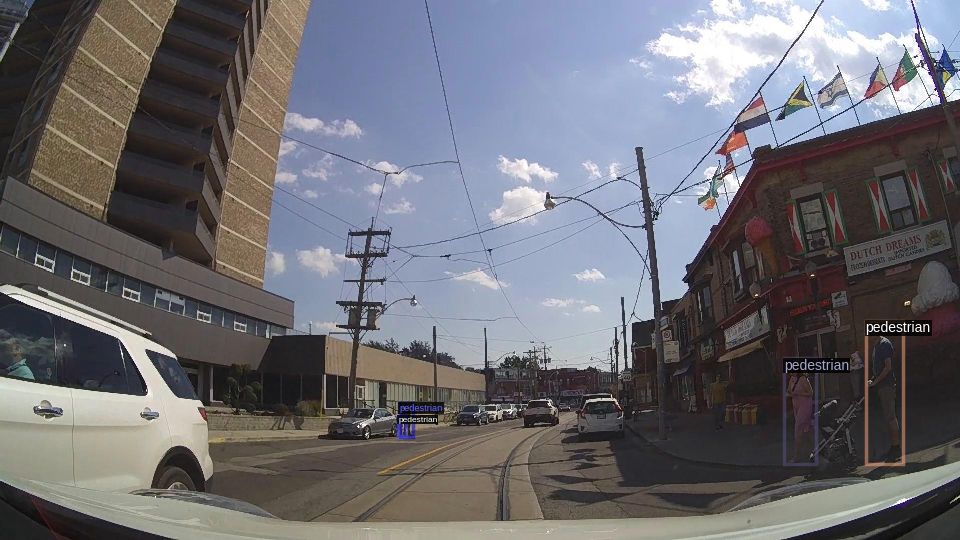

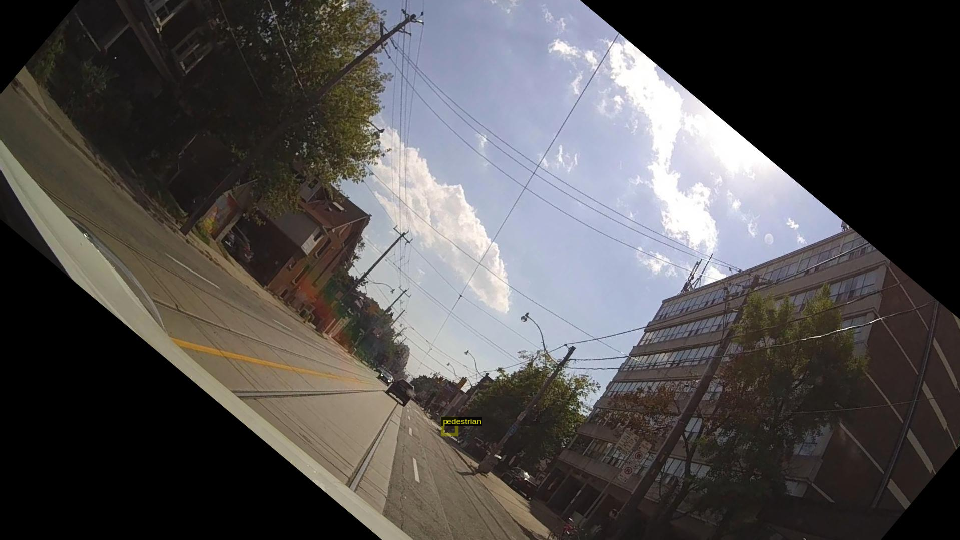

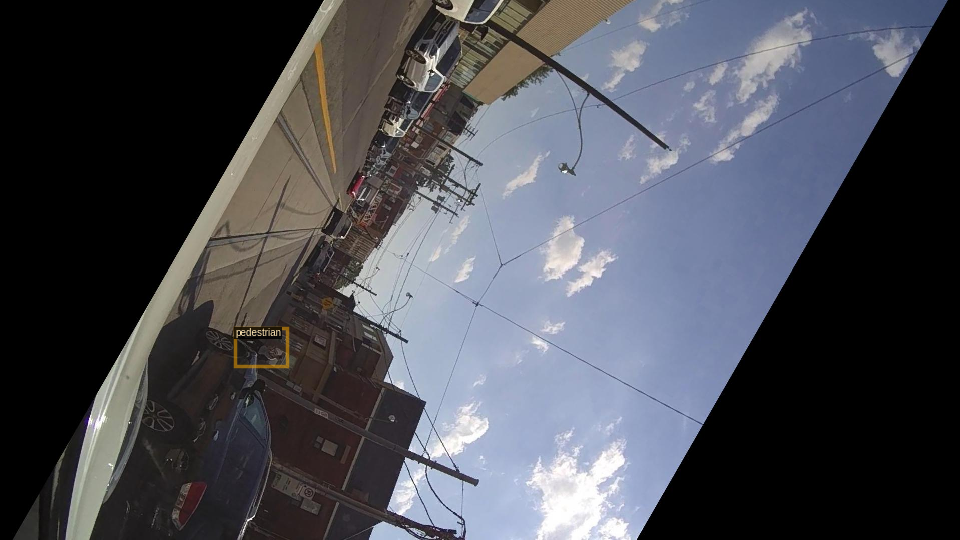

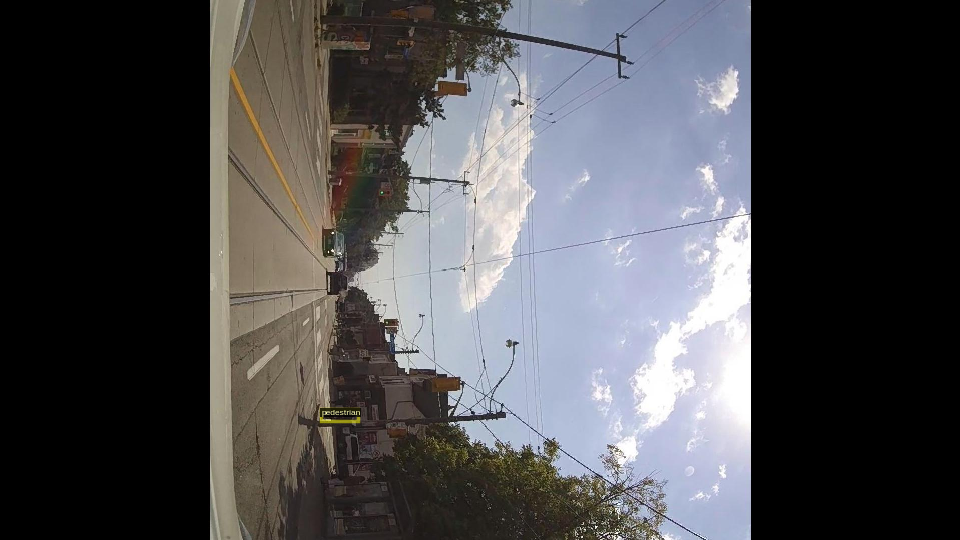

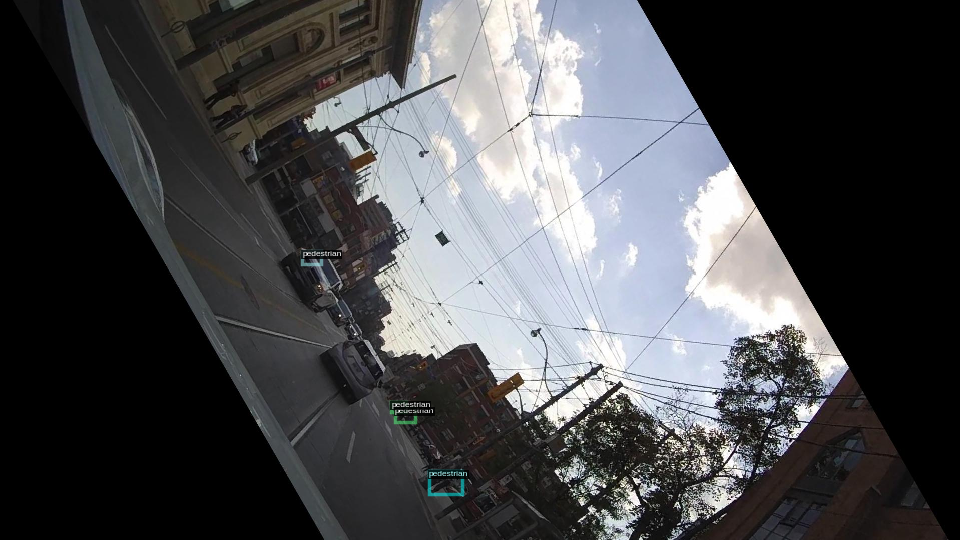

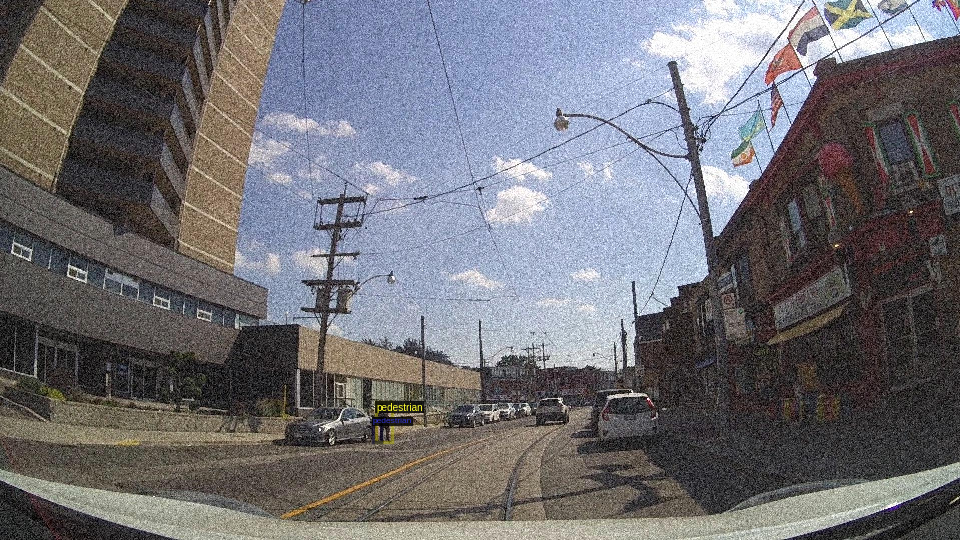

In [ ]:
# #Visualizing the Train Dataset
if(1):
  import os
  #myway
  dataset_dicts = get_balloon_dicts("train_images")
  print(dataset_dicts[:3])
  # print(len(dataset_dicts))
  # sys.exit()

  RDD_metadata = MetadataCatalog.get("RDD_train")

  #Randomly choosing 6 images from the Set
  for d in random.sample(dataset_dicts, 6):
  # for d in dataset_dicts[0:6]:
      img = cv2.imread(d["file_name"])
      visualizer = Visualizer(img[:, :, ::-1], metadata=RDD_metadata, scale=0.5)
      vis = visualizer.draw_dataset_dict(d)
      cv2_imshow(vis.get_image()[:, :, ::-1])


# sys.exit()

##train

In [ ]:
from detectron2.engine import DefaultTrainer
import os

cfg = get_cfg()
cfg.MODEL.DEVICE = "cuda"
# cfg.MODEL.DEVICE='cpu'
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("RDD_train",)
cfg.DATASETS.TEST = ("RDD_test",)
cfg.DATALOADER.NUM_WORKERS = 4
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 4
# cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR: 1.0 map score
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR: 1.0 map score
# cfg.SOLVER.MAX_ITER = 2000
cfg.SOLVER.MAX_ITER = num_iter
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(cate_names)
# cfg.TEST.EVAL_PERIOD = 500 # No. of iterations after which the Validation Set is evaluated.
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.OUTPUT_DIR = "model_final"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()



[05/13 14:11:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_f6e8b1.pkl: 243MB [00:01, 128MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/13 14:12:22 d2.engine.train_loop]: Starting training from iteration 0


## test

[05/13 14:13:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from model_final/model_final.pth ...


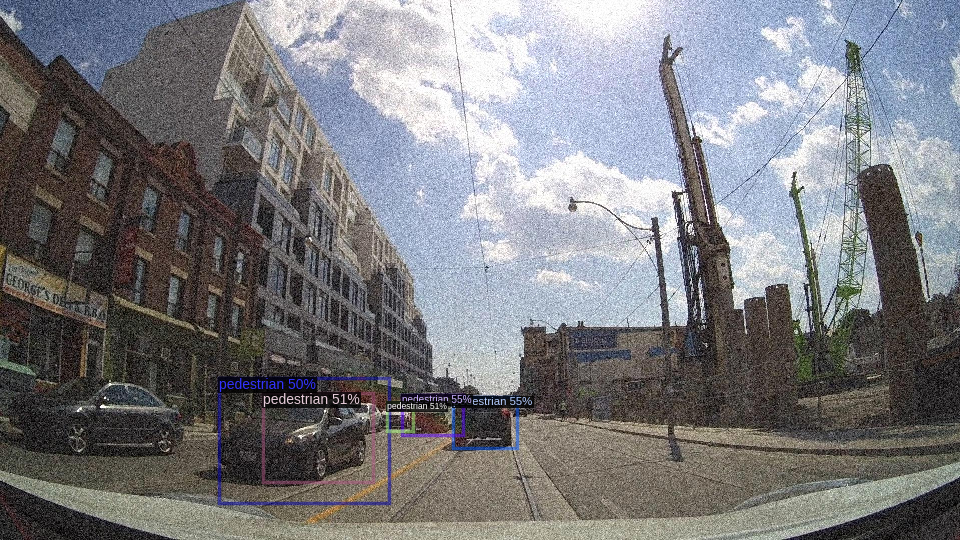

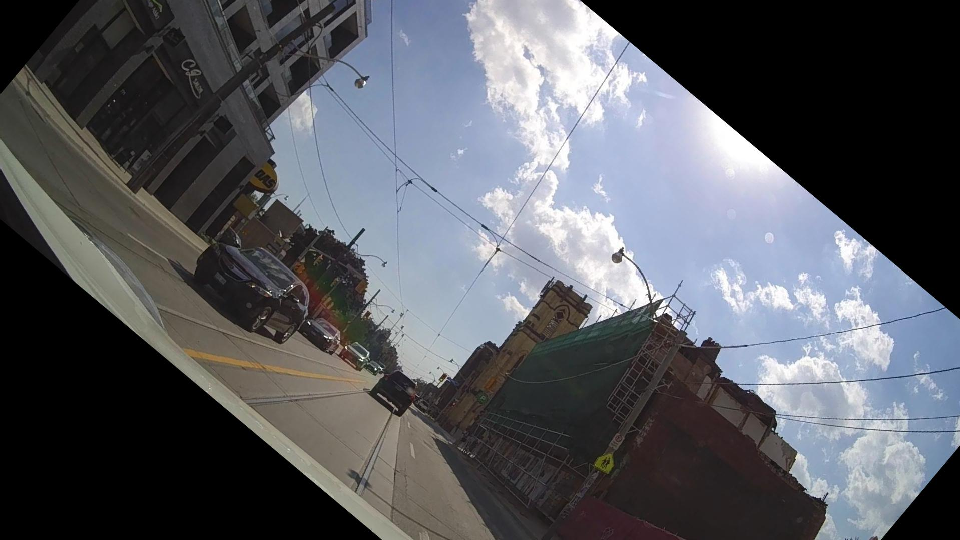

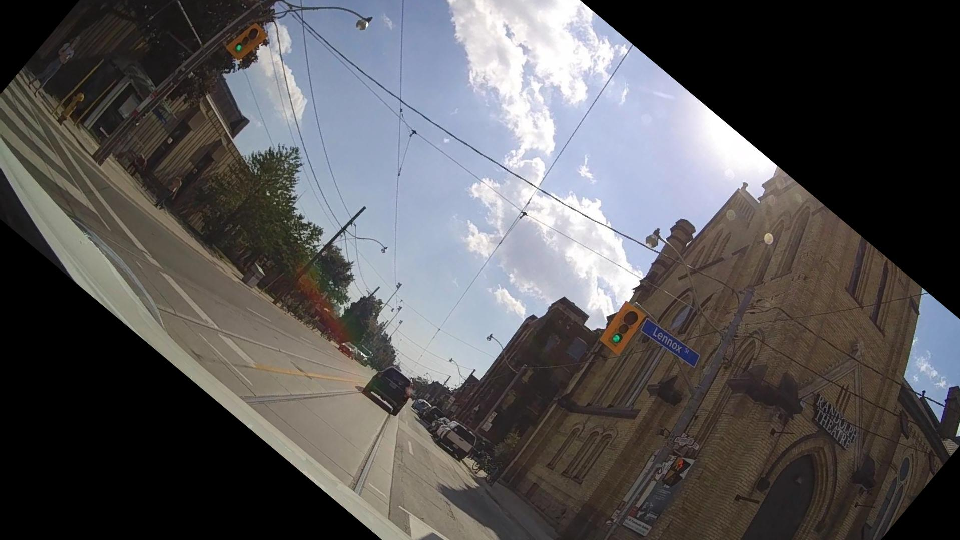

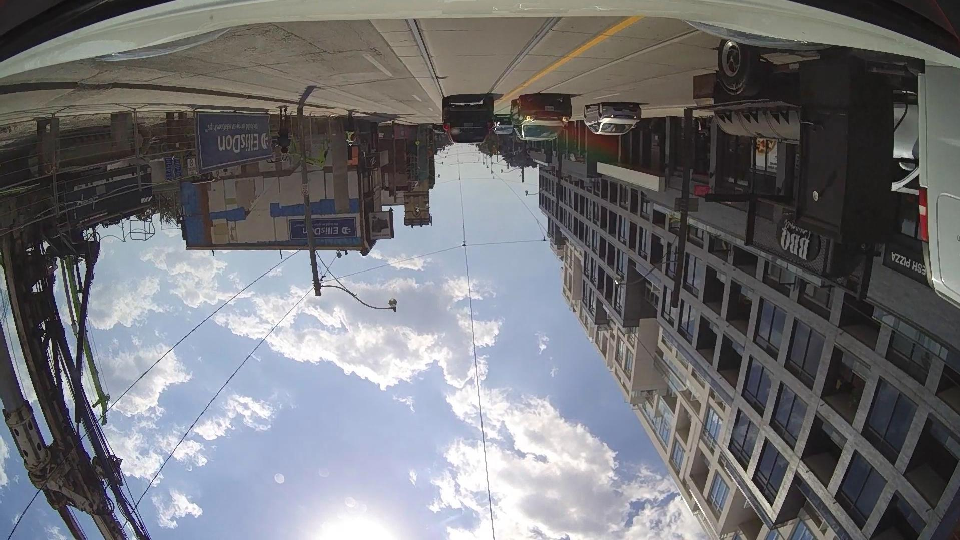

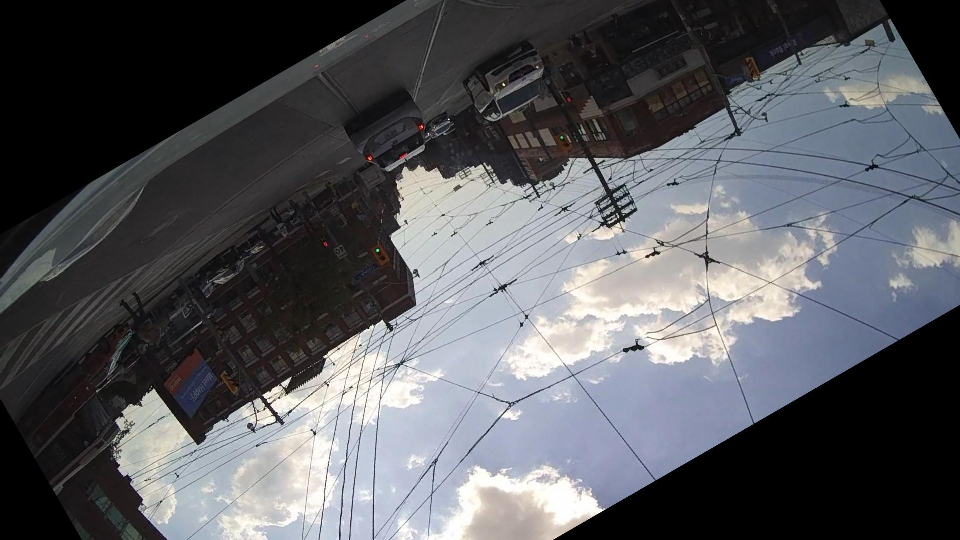

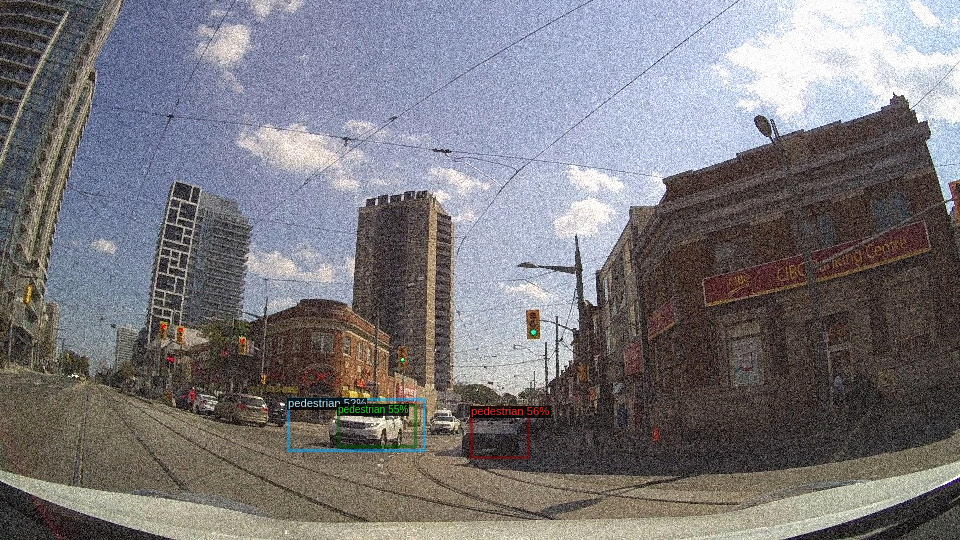

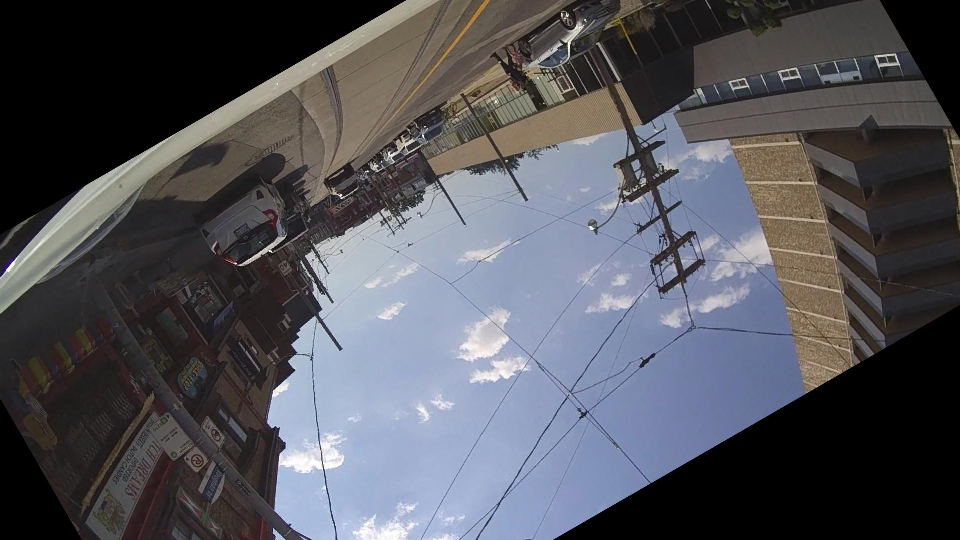

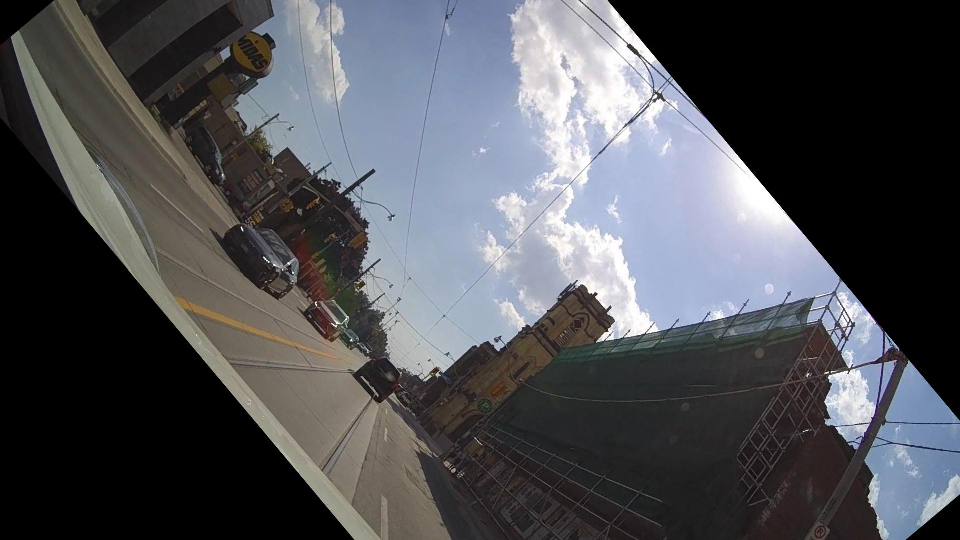

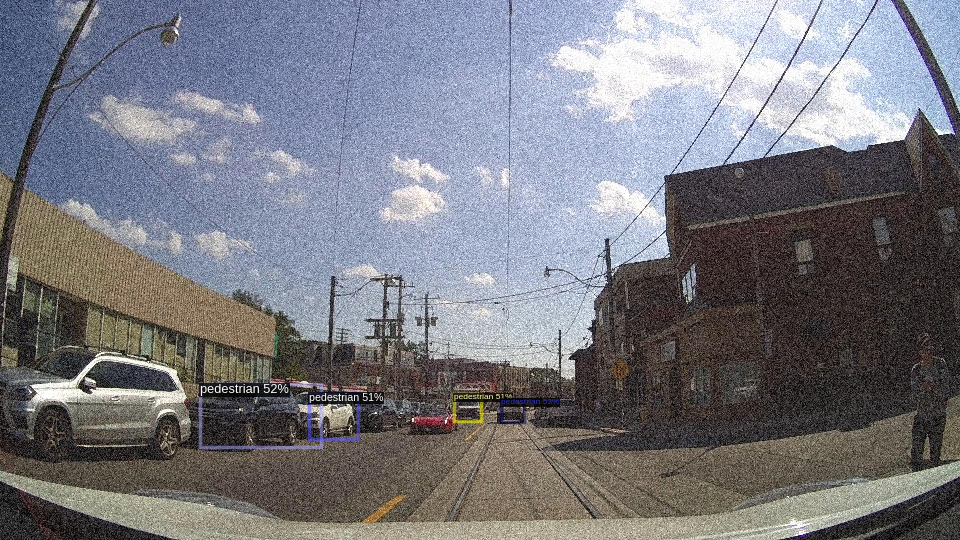

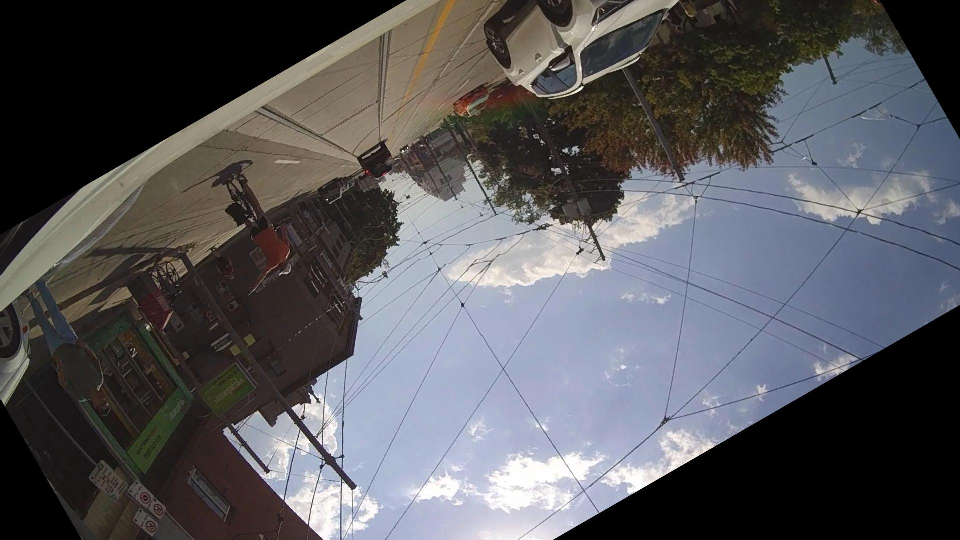

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_balloon_dicts("test_images")

cfg.OUTPUT_DIR = "model_final"
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set the testing threshold for this model
# cfg.DATASETS.TEST = ("bccd_train", )

predictor = DefaultPredictor(cfg)
if len(dataset_dicts) >= 10:
  for d in random.sample(dataset_dicts, 10):
  # for d in dataset_dicts[200:210]:
      im = cv2.imread(d["file_name"])
      outputs = predictor(im)
      v = Visualizer(im[:, :, ::-1],
                    metadata=RDD_metadata,
                    scale=0.5,
                    instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
      )
      v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
      cv2_imshow(v.get_image()[:, :, ::-1])
else:
    print("Error: dataset is too small")




## evaluate

In [ ]:
if(1):
  from detectron2.evaluation import COCOEvaluator, inference_on_dataset
  from detectron2.data import build_detection_test_loader

  # Create config
  cfg = get_cfg()
  cfg.MODEL.DEVICE = "cuda"
  # cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
  cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
  cfg.OUTPUT_DIR = "model_final"
  cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
  # cfg.MODEL.WEIGHTS = "model_final/model_final.pth"
  cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(cate_names)
  cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set the testing threshold for this model
  # cfg.DATASETS.TEST = ("RDD_train", )
  predictor = DefaultPredictor(cfg)

  evaluator = COCOEvaluator("RDD_test", cfg, False, output_dir="/output/")
  val_loader = build_detection_test_loader(cfg, "RDD_test")
  inference_on_dataset(predictor.model, val_loader, evaluator)




## download model final

In [ ]:
#download the converted image folder
if(1):
  from google.colab import files
  files.download("model_final/model_final.pth")

#Evaluate model performance

## Create xmls files from json file

In [ ]:
# Program to read JSON file
# and generate its XML file

# Importing json module and xml
# module provided by python
import json as JS
import xml.etree.ElementTree as ET

# #create xmls folder
# !mkdir xmls

# Opening JSON file in read mode
with open("test_images/annotation.json", "r") as json_file:

  # loading json file data
  # to variable data
  data = JS.load(json_file)
  classes = {}
  for c in data['categories']:
    classes[c['id']]=c['name']


  for img in data['images']:
    print(img)


    # print(data['images'])
    # print(data['annotations'])
    # print(len(data['annotations']))
    # sys.exit()

    # Building the root element of the xml file
    root = ET.Element("annotation")
    ET.SubElement(root, "filename").text = img['file_name']
    ET.SubElement(root, "path").text = img['file_name']
    ET.SubElement(root, "folder").text = "my-project-name"

    size = ET.SubElement(root, "size")
    ET.SubElement(size, "width").text = str(img['width'])
    ET.SubElement(size, "height").text = str(img['height'])
    ET.SubElement(size, "depth").text = '3'

    img_id = img['id']
    for anno in data['annotations']:
      if anno['image_id'] == img_id:
        # print(anno)

        obj = ET.SubElement(root, "object")
        ET.SubElement(obj, "name").text = classes[anno['category_id']]

        bndbox = ET.SubElement(obj, "bndbox")
        ET.SubElement(bndbox, "xmin").text = str(anno['bbox'][0])
        ET.SubElement(bndbox, "ymin").text = str(anno['bbox'][1])
        ET.SubElement(bndbox, "xmax").text = str(anno['bbox'][0] + anno['bbox'][2])
        ET.SubElement(bndbox, "ymax").text = str(anno['bbox'][1] + anno['bbox'][3])

    # Building the tree of the xml elements using the root element
    tree = ET.ElementTree(root)
    # Writing the xml to output file
    tree.write("test_images/"+img['file_name'].replace('.jpg','')+".xml")


# #delete test_images.zip
# !rm test_images.zip

# #zip test_images
# !zip -r test_images.zip test_images

# if(0):
#   from google.colab import files
#   files.download("test_images.zip")

## display the ground truth annotation from xml file

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
from PIL import Image
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xmltodict
import os

# function given xml path, return box xy coordinates and object names
def xml_xy_name(path):
  # parse xml file
  xy_coord = []
  obj_names = []
  doc = xmltodict.parse(open(path).read(), force_list=('object'))
  if 'object' in doc['annotation']:
    for obj in doc['annotation']['object']:
      obj_names.append(obj['name'])
      x1 = float(obj["bndbox"]["xmin"])
      y1 = float(obj["bndbox"]["ymin"])
      x2 = float(obj["bndbox"]["xmax"])
      y2 = float(obj["bndbox"]["ymax"])
      xy_coord.append([x1, y1, x2, y2])
  return xy_coord, obj_names

all_images = [filename.path for filename in os.scandir("test_images/") if filename.is_file() and 'jpg' in filename.path]

fig, ax = plt.subplots(3,3,figsize=(12,8))
for i in range(3):
  for j in range(3):
    root = all_images[50+i*3+j]
    # root = "test_images/PP-02_flip_vr.jpg"
    xy_coord, obj_names = xml_xy_name(root.replace('jpg','xml'))

    #plot
    im = Image.open(root)
    for idx,xy in enumerate(xy_coord):
        x1 = xy[0]
        y1 = xy[1]
        width = xy[2]-xy[0]
        height = xy[3]-xy[1]
        rect = patches.Rectangle((x1,y1), width, height, linewidth=1, edgecolor='r', facecolor='none')
        ax[i,j].add_patch(rect) # Add the patch to the Axes
        ax[i,j].set_title(root.split("/")[-1])
        ax[i,j].text(x1+width/2, y1+height/2, obj_names[idx], style ='italic', color ="red", fontsize = 10)
    ax[i,j].imshow(im)
    ax[i,j].axis('off')
fig.tight_layout()


# display prediction

In [ ]:
import detectron2
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
import cv2
from PIL import Image
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches


#given detectron2 predictor and image path, return box xy coordinates and obj name
def predictor_xy_name(predictor, path):
  #prediction
  im = cv2.imread(path)
  outputs = predictor(im)
  instances = outputs["instances"]
  detected_class_indexes = instances.pred_classes
  prediction_boxes = instances.pred_boxes
  xy_coord = []
  obj_names = []
  for idx, coordinates in enumerate(prediction_boxes):
      obj_names.append(detected_class_indexes[idx])
      xy = coordinates.cpu().numpy()
      x1 = xy[0]
      y1 = xy[1]
      x2 = xy[2]
      y2 = xy[3]
      xy_coord.append([x1, y1, x2, y2])
  return xy_coord, obj_names

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = "/content/model_final/model_final.pth"  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(cate_names)
predictor = DefaultPredictor(cfg)

# cate_names = ['HEAT EXCHANGER', 'PRESSURE GAUGE', 'PRESSURE VESSEL', 'PUMP']

fig, ax = plt.subplots(4,4,figsize=(12,8))

all_images = [filename.path for filename in os.scandir("test_images/") if filename.is_file() and 'jpg' in filename.path]

for i in range(4):
  for j in range(4):
    root = all_images[20+i*4+j]
    # root = "test_images/PP-03_flip_vr.jpg"
    xy_coord, obj_names = predictor_xy_name(predictor, root)
    print(xy_coord)

    #plot
    im = Image.open(root)
    for idx,xy in enumerate(xy_coord):
        x1 = xy[0]
        y1 = xy[1]
        width = xy[2]-xy[0]
        height = xy[3]-xy[1]
        rect = patches.Rectangle((x1,y1), width, height, linewidth=1, edgecolor='r', facecolor='none')
        ax[i,j].text(x1+width/2, y1+height/2, cate_names[obj_names[idx]], style ='italic', color ="red", fontsize = 10)
        ax[i,j].add_patch(rect) # Add the patch to the Axes
    # Display the image
    ax[i,j].set_title(root.split("/")[-1])
    ax[i,j].imshow(im)
    ax[i,j].axis('off')
fig.tight_layout()


## calculate IOU

In [ ]:
from sklearn import metrics

def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

# cate_names = ['HEAT EXCHANGER', 'PRESSURE GAUGE', 'PRESSURE VESSEL', 'PUMP']
threshold = 0.5
y_true = []
y_pred = []


all_images = [filename.path for filename in os.scandir("test_images/") if filename.is_file() and 'jpg' in filename.path]

for root in all_images:
	# print(root)
	xy_coord_true, obj_names_true = xml_xy_name(root.replace('jpg','xml'))
	xy_coord_pred, obj_names_pred = predictor_xy_name(predictor, root)

	pred_index = [i for i in range(len(xy_coord_pred))]
	pred_matched_index = []

	for xy_gt, name_gt in zip(xy_coord_true, obj_names_true):
		matched = 0
		for idx, (xy_pred, name_pred) in enumerate(zip(xy_coord_pred, obj_names_pred)):
			if cate_names.index(name_gt) == name_pred and bb_intersection_over_union(xy_gt, xy_pred)>=0.5:
				pred_matched_index.append(idx)
				matched = 1
				break

		#check if this ground truth object has been matched
		if matched ==1:
			y_true.append(cate_names.index(name_gt))
			y_pred.append(name_pred.cpu().item())
		else:
			y_true.append(cate_names.index(name_gt))
			y_pred.append(-1)

	#check if there is any predicted objects that have not been matched.
	for i in list(set(pred_index) - set(pred_matched_index)):
		# y_pred.append(name_pred.cpu().item())
		y_pred.append(obj_names_pred[i].cpu().item())
		y_true.append(-2)

# print(y_true)
# print(y_pred)

metrics.classification_report(y_true, y_pred, output_dict=True)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

{'-2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6598},
 '-1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0},
 '0': {'precision': 0.001815431164901664,
  'recall': 0.0006153215054866168,
  'f1-score': 0.0009191176470588235,
  'support': 19502},
 'accuracy': 0.0004597701149425287,
 'macro avg': {'precision': 0.000605143721633888,
  'recall': 0.00020510716849553895,
  'f1-score': 0.00030637254901960784,
  'support': 26100},
 'weighted avg': {'precision': 0.0013564957309544926,
  'recall': 0.0004597701149425288,
  'f1-score': 0.0006867675231011945,
  'support': 26100}}